In [ ]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

In [ ]:
(X_train, y_train), (X_test, y_test) = keras.datasets.mnist.load_data()
X_train, X_test = X_train.reshape((-1, 28*28)), X_test.reshape((-1, 28*28))
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((60000, 784), (60000,), (10000, 784), (10000,))

In [ ]:
X_train, X_test = X_train / 255.0, X_test / 255.0
X_train.min(), X_train.max(), X_test.min(), X_test.max()

(0.0, 1.0, 0.0, 1.0)

In [ ]:
y_train.min(), y_train.max(), y_test.min(), y_test.max()

(0, 9, 0, 9)

# 784D ---> 3D

In [ ]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=3)
data_3D = tsne.fit_transform(X_train[:5000])

In [ ]:
data_viz = np.concatenate((data_3D, y_train[:5000].reshape(len(y_train[:5000]), 1)), axis = 1)
data_viz = pd.DataFrame(data_viz, columns = ["dim1", "dim2", "dim3", "y"])
data_viz.head(5)

,dim1,dim2,dim3,y
0,4.106591,4.962294,-4.363456,5.0
1,18.805737,7.926847,1.543827,0.0
2,7.886828,-17.943007,-3.526214,4.0
3,-16.565699,1.945463,8.344349,1.0
4,-4.297154,-9.595972,-3.469287,9.0


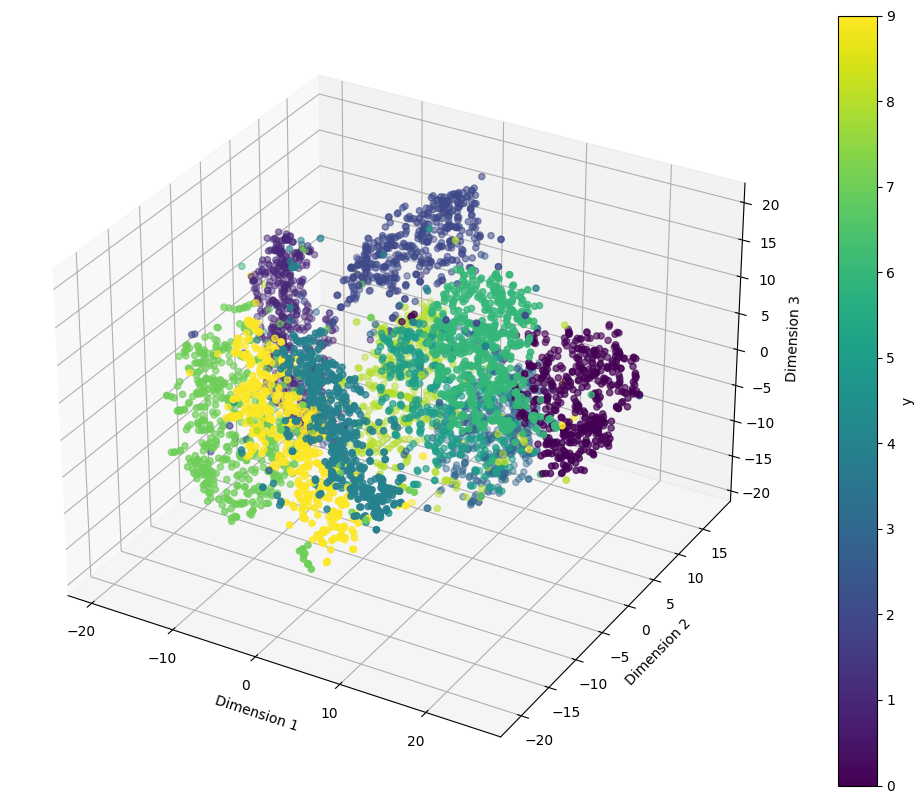

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import seaborn as sns

fig = plt.figure(figsize=(15, 10))
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(data_viz["dim1"], data_viz["dim2"], data_viz["dim3"], c=data_viz["y"], cmap="viridis")

ax.set_xlabel("Dimension 1")
ax.set_ylabel("Dimension 2")
ax.set_zlabel("Dimension 3")

cbar = fig.colorbar(scatter)
cbar.set_label("y")

plt.show()

# Using a model to learn representations

In [ ]:
model = keras.models.Sequential([
    keras.layers.Dense(30, input_shape = [28*28], activation = "selu", kernel_initializer = "lecun_normal"),
    keras.layers.Dense(20, activation = "selu", kernel_initializer = "lecun_normal"),
    keras.layers.Dense(10, activation = "selu", kernel_initializer = "lecun_normal"),
    keras.layers.Dense(10, activation = "softmax", kernel_initializer = "lecun_normal")
])
model.summary()

Model: "sequential_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_33 (Dense)            (None, 30)                23550     
                                                                 
 dense_34 (Dense)            (None, 20)                620       
                                                                 
 dense_35 (Dense)            (None, 10)                210       
                                                                 
 dense_36 (Dense)            (None, 10)                110       
                                                                 
Total params: 24,490
Trainable params: 24,490
Non-trainable params: 0
_________________________________________________________________


In [ ]:
model.compile(optimizer = keras.optimizers.Adam(learning_rate = 0.0003), loss = "sparse_categorical_crossentropy", metrics = ["accuracy"])

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
class RecordModelsCallback(keras.callbacks.Callback):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self.models_per_epoch = []

    def on_epoch_end(self, epoch, logs=None):
        cloned_model = keras.models.clone_model(self.model)
        cloned_model.set_weights(self.model.get_weights())
        self.models_per_epoch.append(cloned_model)

record_models_callback = RecordModelsCallback(model)

history = model.fit(
    X_train[:55_000], y_train[:55_000],
    epochs=500, validation_data=(X_train[55_000:], y_train[55_000:]),
    callbacks=[keras.callbacks.EarlyStopping(patience=3, restore_best_weights=True), record_models_callback]
)

models_per_epoch = record_models_callback.models_per_epoch

Epoch 1/500
1719/1719 [==============================] - 7s 4ms/step - loss: 0.5997 - accuracy: 0.8391 - val_loss: 0.2499 - val_accuracy: 0.9330
Epoch 2/500
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2792 - accuracy: 0.9201 - val_loss: 0.1926 - val_accuracy: 0.9460
Epoch 3/500
1719/1719 [==============================] - 5s 3ms/step - loss: 0.2293 - accuracy: 0.9327 - val_loss: 0.1751 - val_accuracy: 0.9506
Epoch 4/500
1719/1719 [==============================] - 6s 4ms/step - loss: 0.1986 - accuracy: 0.9412 - val_loss: 0.1562 - val_accuracy: 0.9562
Epoch 5/500
1719/1719 [==============================] - 6s 3ms/step - loss: 0.1751 - accuracy: 0.9480 - val_loss: 0.1496 - val_accuracy: 0.9576
Epoch 6/500
1719/1719 [==============================] - 7s 4ms/step - loss: 0.1589 - accuracy: 0.9526 - val_loss: 0.1382 - val_accuracy: 0.9604
Epoch 7/500
1719/1719 [==============================] - 6s 4ms/step - loss: 0.1452 - accuracy: 0.9564 - val_loss: 0.1376 - val_ac

In [ ]:
repr_1 = []
repr_2 = []
repr_3 = []
for model_ in models_per_epoch:
  repr_at_layer_1 = model_.layers[0](X_train[:5000])
  repr_at_layer_2 = model_.layers[1](repr_at_layer_1)
  repr_at_layer_3 = model_.layers[2](repr_at_layer_2)

  repr_1.append(repr_at_layer_1)
  repr_2.append(repr_at_layer_2)
  repr_3.append(repr_at_layer_3)

In [100]:
def plot_figure(data_viz, epoch, repr_img_list, angle):
  fig = plt.figure(figsize=(20, 15))
  ax = fig.add_subplot(111, projection='3d')

  scatter = ax.scatter(data_viz["dim1"], data_viz["dim2"], data_viz["dim3"], c=data_viz["y"], cmap="viridis")

  ax.set_xlabel("Feature 1")
  ax.set_ylabel("Feature 2")
  ax.set_zlabel("Feature 3")

  ax.set_xlim(-20, 20)
  ax.set_ylim(-20, 20)
  ax.set_zlim(-20, 20)

  cbar = fig.colorbar(scatter)
  cbar.set_label("y")

  plt.title(f"Epoch: {epoch}")

  ax.view_init(angle, angle)
  plt.savefig(f"repr_plot_{epoch}.png")
  repr_img_list.append(f"repr_plot_{epoch}.png")
  plt.show()

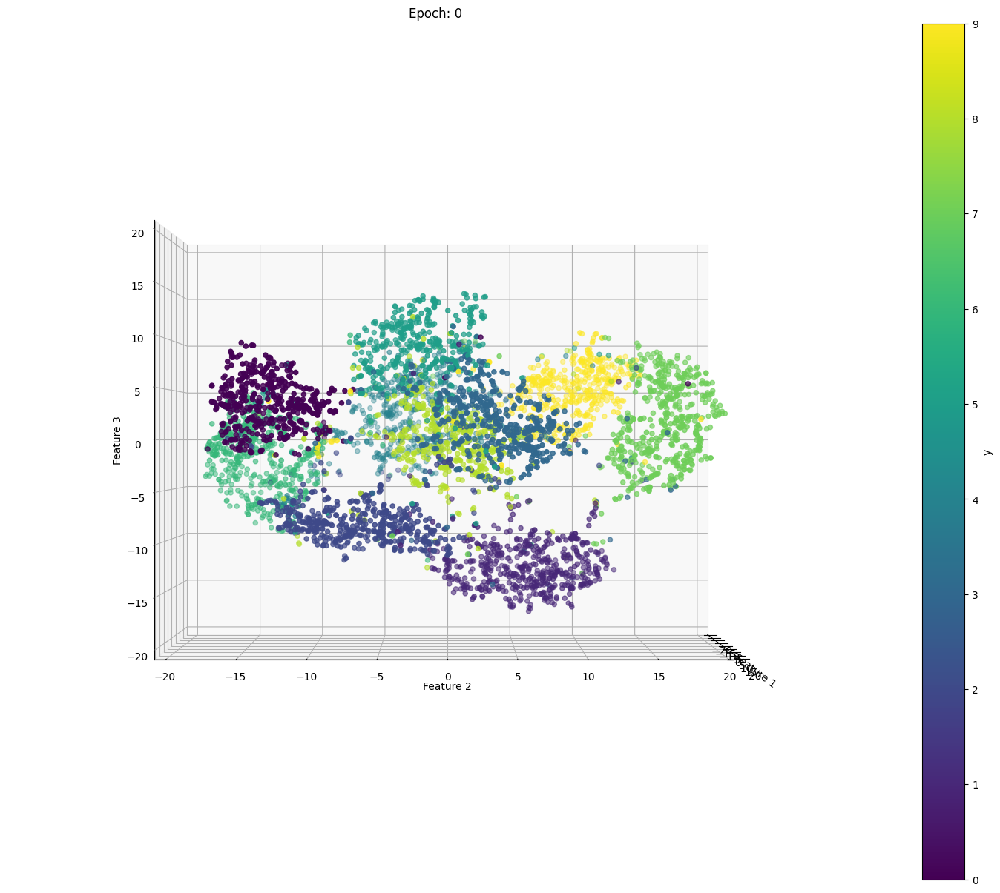

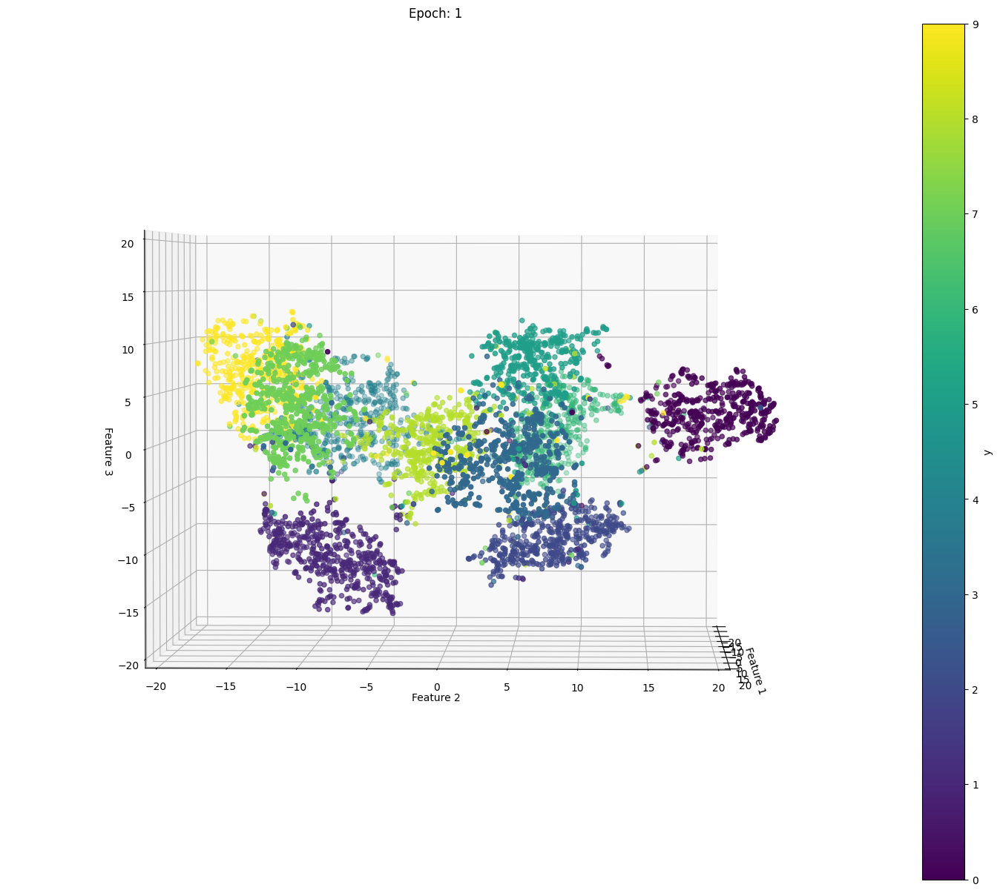

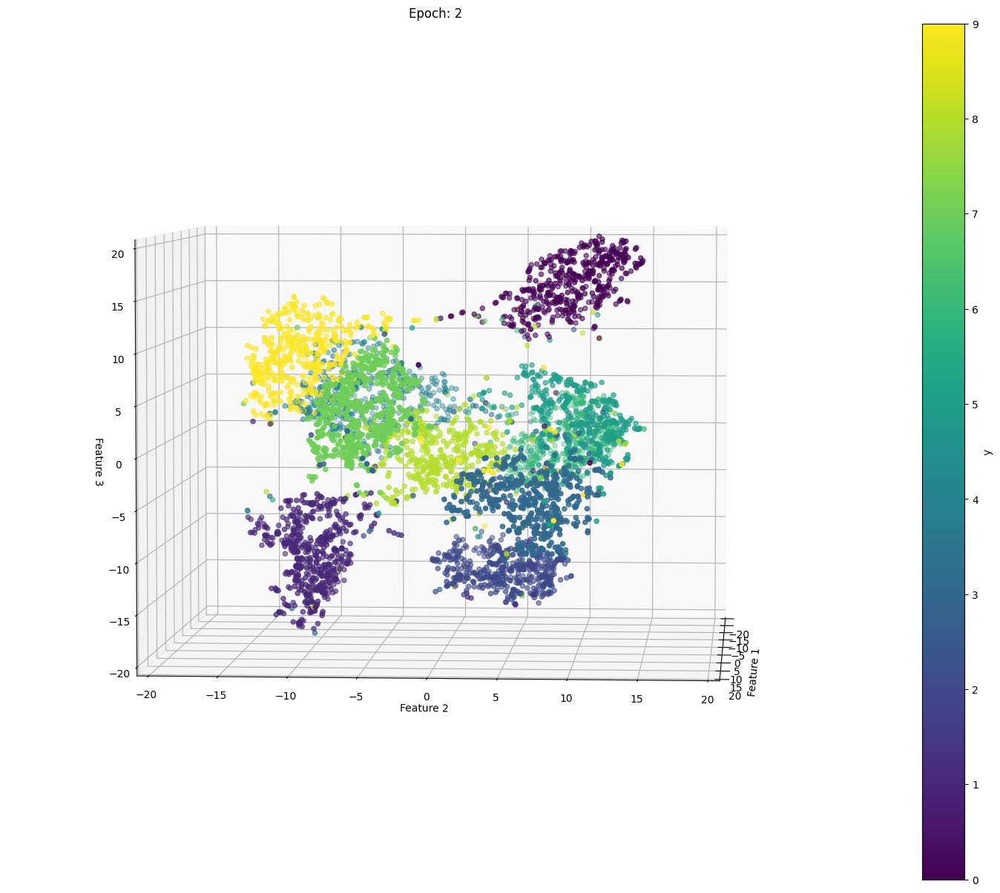

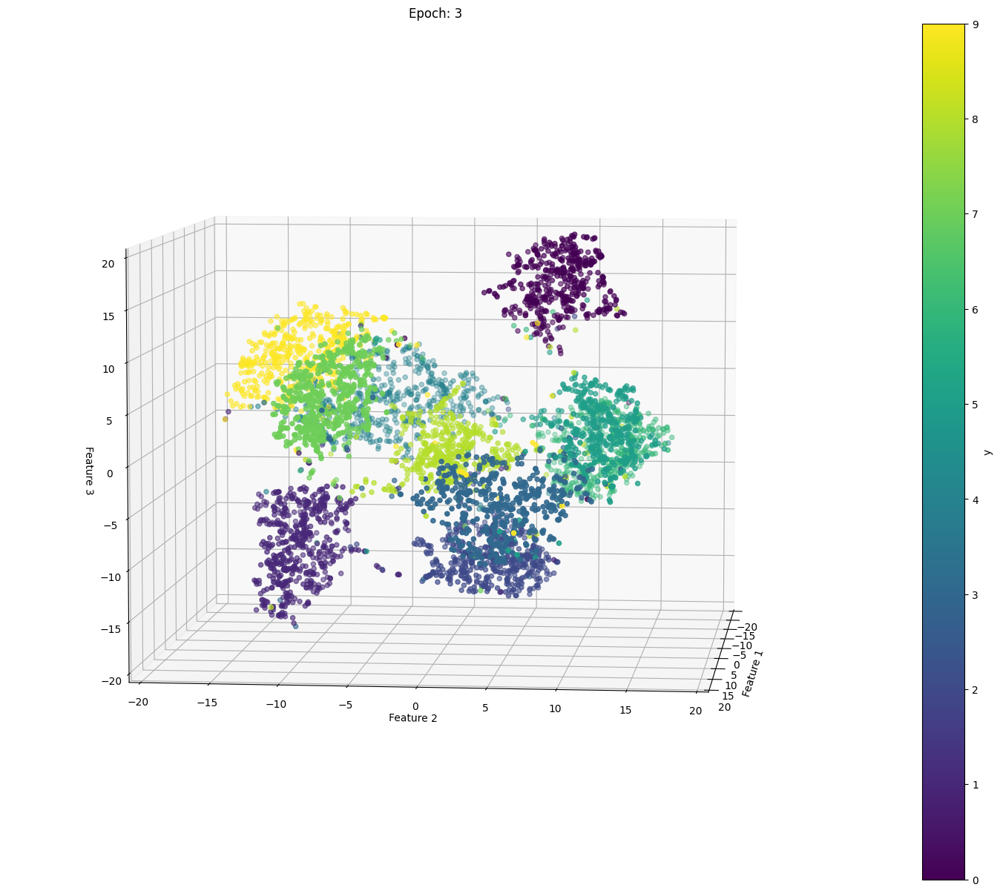

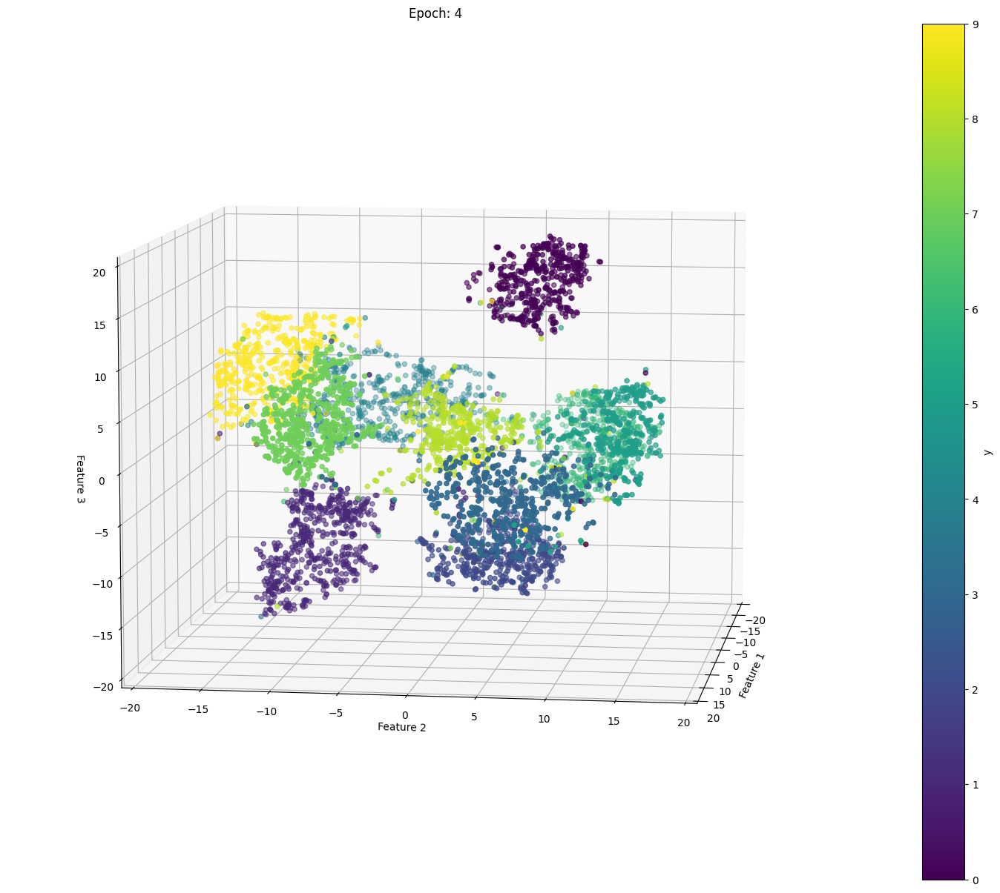

...

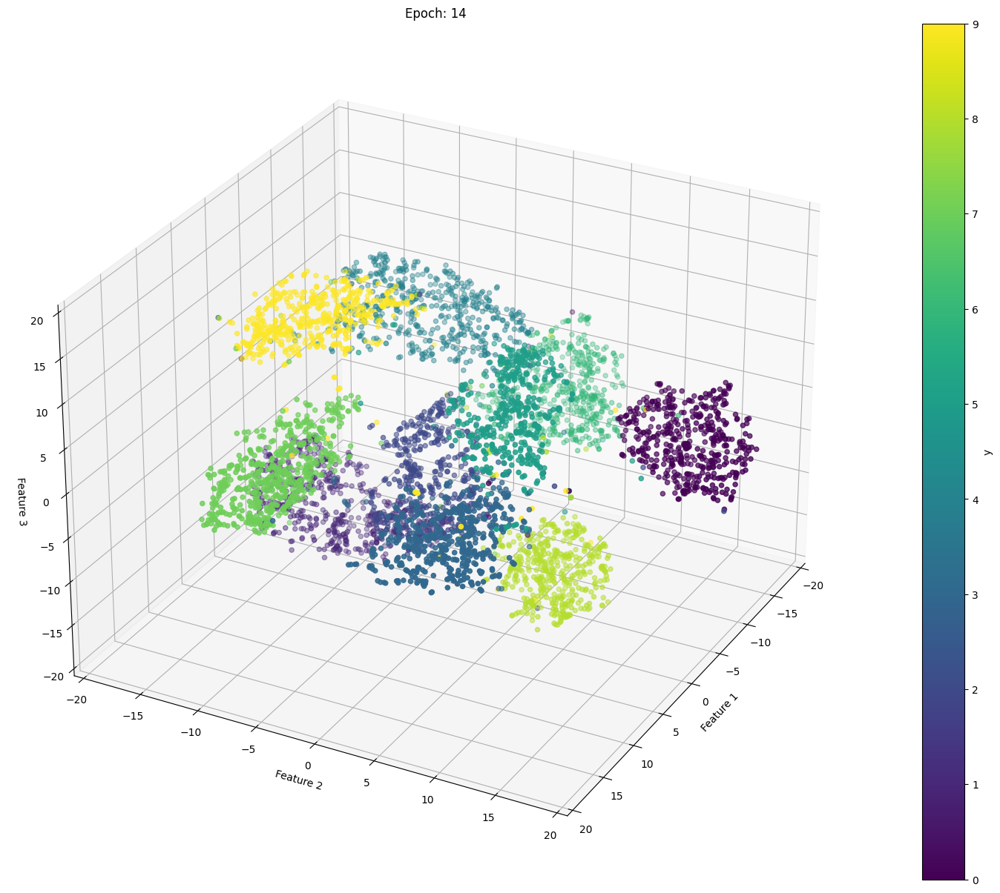

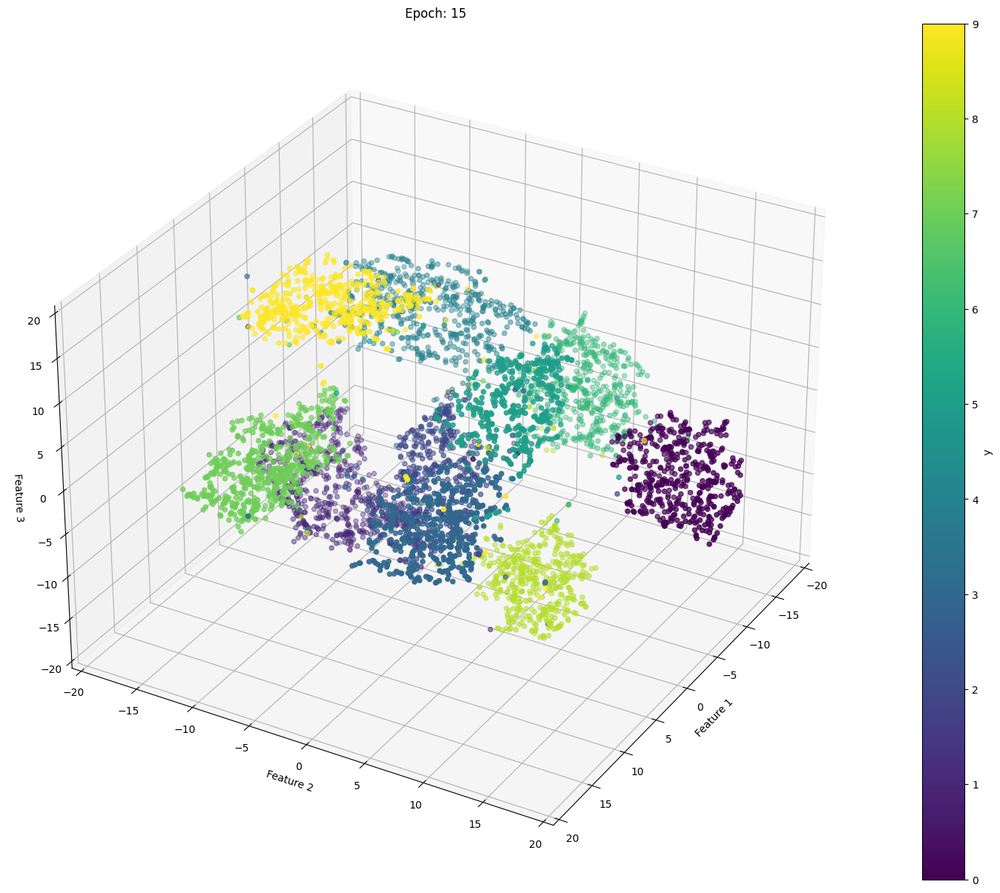

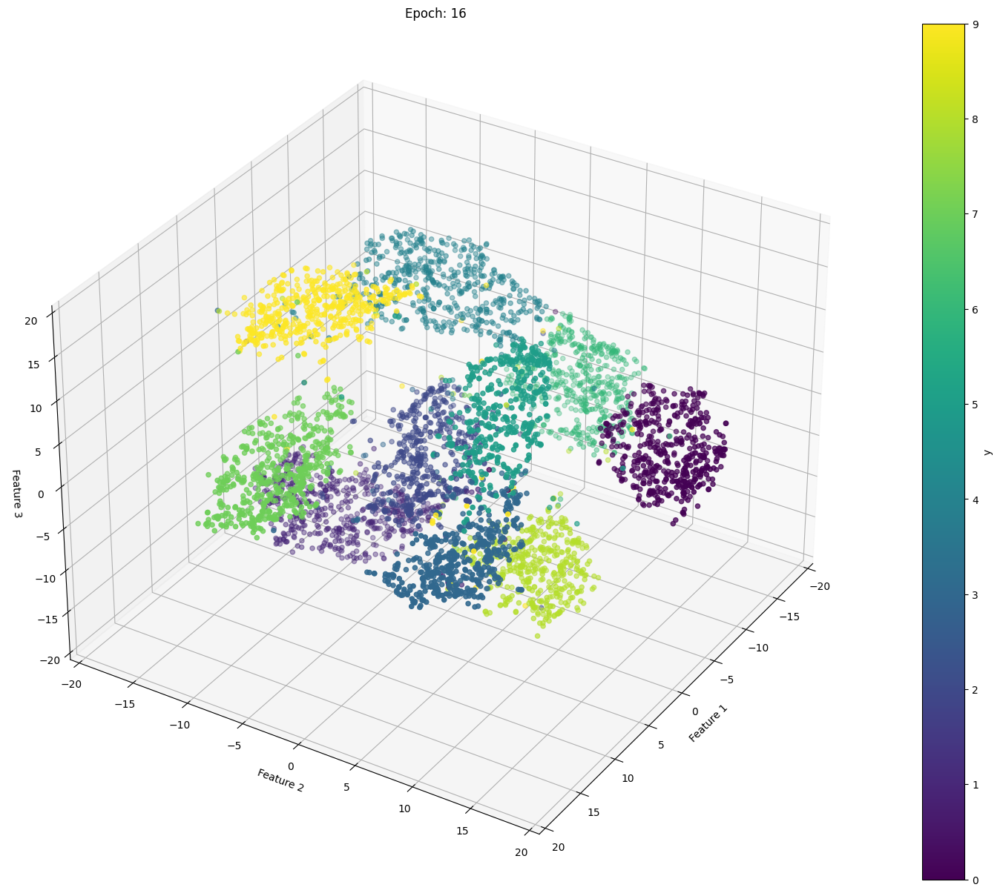

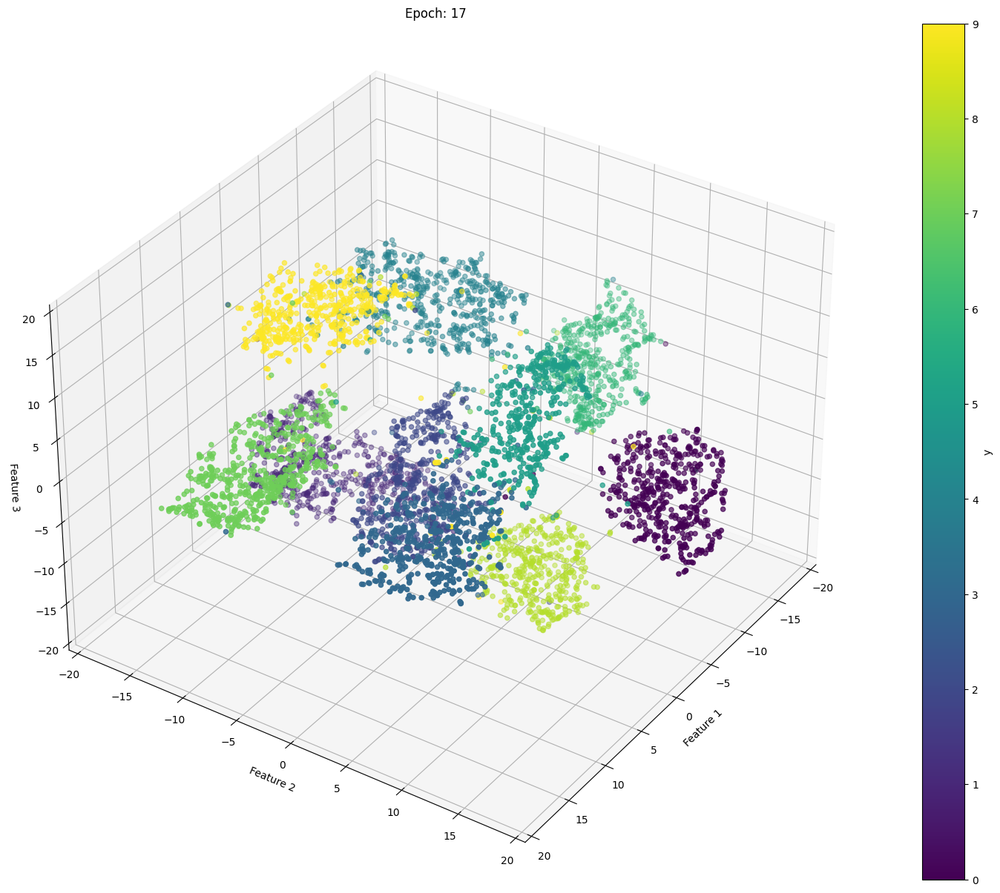

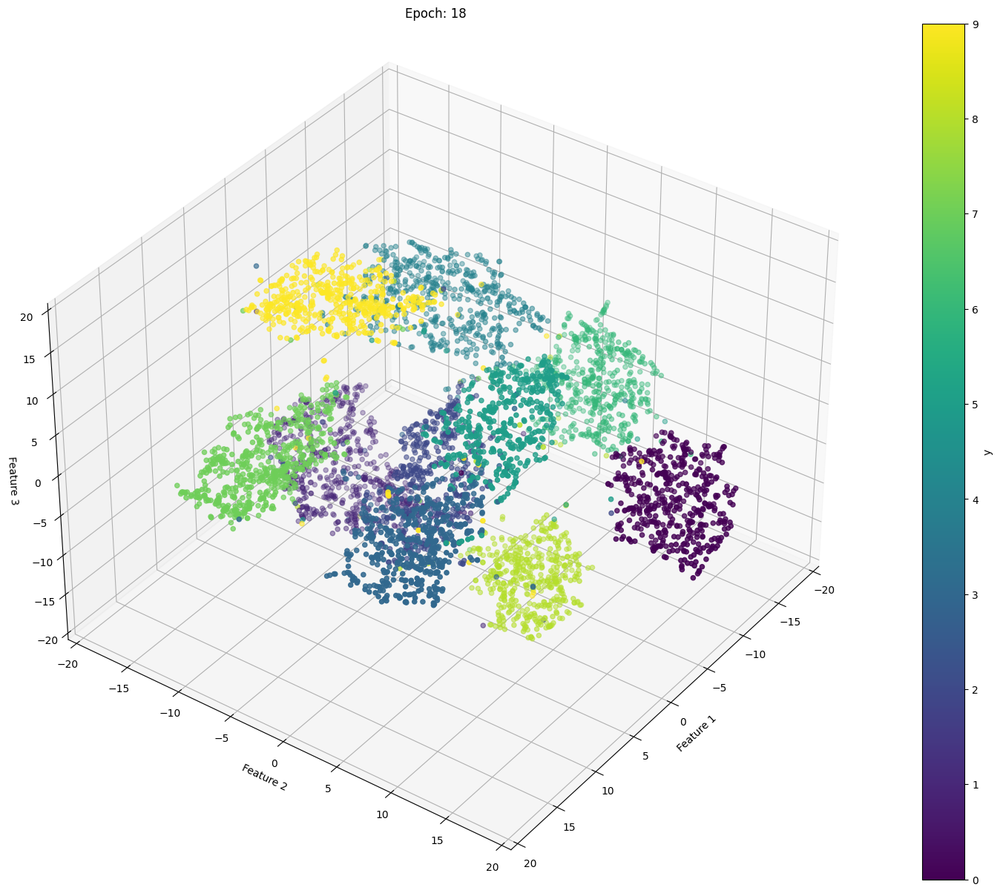

In [101]:
repr_3_img_list = []
count = 0
angle = 0
for repr in repr_3:
  tsne = TSNE(n_components=3)
  data_3D = tsne.fit_transform(repr)

  data_viz = np.concatenate((data_3D, y_train[:5000].reshape(len(y_train[:5000]), 1)), axis = 1)
  data_viz = pd.DataFrame(data_viz, columns = ["dim1", "dim2", "dim3", "y"])
  data_viz.head(5)

  plot_figure(data_viz, count, repr_3_img_list, angle)

  count += 1
  angle += 2

In [105]:
import imageio
with imageio.get_writer('repr_space_3test.gif', mode='I') as writer:
  for filename in repr_3_img_list:
    image = imageio.imread(filename)
    writer.append_data(image)

<ipython-input-105-a54a89cf93eb>:4: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(filename)


In [113]:
tsne = TSNE()
data_2D = tsne.fit_transform(repr_3[18])

In [114]:
data_viz = np.concatenate((data_2D, y_train[:5000].reshape(len(y_train[:5000]), 1)), axis = 1)
data_viz = pd.DataFrame(data_viz, columns = ["dim1", "dim2", "y"])
data_viz.head(5)

,dim1,dim2,y
0,28.249489,35.713493,5.0
1,-2.914193,69.834076,0.0
2,-46.460693,-9.050170,4.0
3,23.770515,-61.980595,1.0
4,-29.087246,-40.148853,9.0


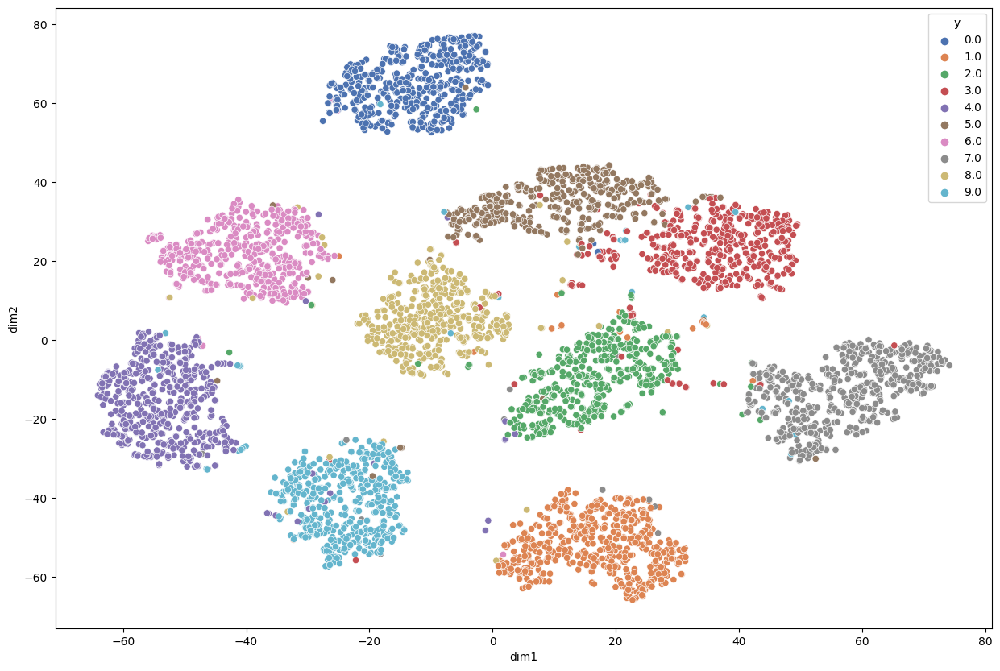

In [115]:
plt.figure(figsize = (15, 10))
sns.scatterplot(data = data_viz, x = "dim1", y = "dim2", hue = "y", palette = "deep")
plt.show()